# Arrests Exploratory Data Analysis 
This notebook contains EDA on the NYPD arrests records from 2006 to 2019, obtained from [Kaggle](https://www.kaggle.com/thaddeussegura/nypd-arrest-data-20062019)

The column descriptions can be found [here](https://opendatanetwork.herokuapp.com/dataset/data.cityofnewyork.us/5uac-w243)

---
## Imports
---

In [2]:
import pandas as pd 
import numpy as np 
import seaborn as sns
import datetime
import time
import matplotlib.pyplot as plt

from tqdm import tqdm
from haversine import haversine, Unit
from sklearn.cluster import DBSCAN, KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, VotingClassifier
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score

sns.set(style="ticks", context="talk")
plt.style.use("fivethirtyeight")

In [3]:
nypd = pd.read_csv('./cleaned_datasets/cleaned_all_nypd_arrests_data.csv')

In [4]:
nypd.columns

Index(['Unnamed: 0', 'ARREST_DATE', 'PD_DESC', 'KY_CD', 'OFNS_DESC',
       'LAW_CODE', 'ARREST_BORO', 'ARREST_PRECINCT', 'JURISDICTION_CODE',
       'PERP_SEX', 'PERP_RACE', 'X_COORD_CD', 'Y_COORD_CD', 'Latitude',
       'Longitude', 'perp_age_enc', 'perp_gender'],
      dtype='object')

---
## Create Description and Mapping Functions 
---

In [122]:
def arrest_map(arrested_for, background=True, title=False):
    """
    arrested_for ['string']
    background=True
    title=False
    
    This function will search for a string in the PD_DESC arrest reason, and returns a map
    of that shows the arrest counts heatmapped by precinct
    
    background - for more sparse types of arrests, set or leave True to have a light greyscale 
    map of all arrests plotted behind the arrests of this type, to maintain geographic coherence 
    
    title - insert a string here as needed for formatting reasons since the default will also print any 
    REGEX expressions in the title 
    """

    new_table = nypd[nypd.PD_DESC.str.contains(arrested_for)].copy()
    new_table['charge'] = new_table['ARREST_PRECINCT'].map(new_table.groupby('ARREST_PRECINCT')['OFNS_DESC'].count())

    plt.figure(figsize=(14, 10))
    if background == True:
        plt.scatter(data=nypd, x='Longitude', y='Latitude',
                   color='grey', s=0.2, alpha=0.1, vmax=0.2)
    plt.scatter(data=new_table, x='Longitude', y='Latitude', c='charge',
               cmap='YlOrRd', s=4, alpha=1,)
    plt.xlabel('Longitude')
    plt.ylabel('Latitude')
    if not title:
        plt.title(f'Arrests for {arrested_for.title()} \n by Precinct', fontsize=24, y=1.03)
    else:
        plt.title(f'Arrests for {title.title()} \n by Precinct', fontsize=24, y=1.03)

In [121]:
def arrest_demos_map(arrested_for, background=False, title=False):
    """
    arrested_for ['string']
    background=True
    title=False
    
    This function will search for a string in the PD_DESC arrest reason, and returns a map
    of that shows the arrests color-coded by racial demographics. Please note that despite
    great effort to mitigate this, Seaborn does not always choose the same categories in the 
    same color order
    
    background - for more sparse types of arrests, set or leave True to have a light greyscale 
    map of all arrests plotted behind the arrests of this type, to maintain geographic coherence 
    
    title - insert a string here as needed for formatting reasons since the default will also print any 
    REGEX expressions in the title 
    """
    new_table = nypd[nypd.PD_DESC.str.contains(arrested_for)].copy()
    new_table = new_table[new_table.PERP_RACE != 'UNKNOWN'].copy()

    plt.figure(figsize=(14, 10))
    if background == True:
        grey = plt.scatter(data=nypd, x='Longitude', y='Latitude',
                   color='grey', s=0.2, alpha=0.1, vmax=0.2)
    colors = ['cadetblue', 'indianred',  'lavender', 
              'lawngreen', 'purple', 'gold', 'mediumseagreen']

    sns.scatterplot(data=new_table, hue='PERP_RACE', palette='nipy_spectral',
            x='Longitude', y='Latitude', 
            s=5, alpha=1)
    plt.legend(loc='upper left')        
    plt.xlabel('Longitude')
    plt.ylabel('Latitude')
    if not title:
        plt.title(f'Arrests for {arrested_for.title()} \n by Demographics', fontsize=24, y=1.03)
    else:
        plt.title(f'Arrests for {title.title()} \n by Demographics', fontsize=24, y=1.03)

In [112]:
def map_describe(arrested_for, background=True, title=False):
    """
    arrested_for ['string']
    background=True
    title=False
    
    This function will search for a string in the PD_DESC arrest reason, and returns 
    1) The count of each arrest with a description that matches
    2) Normalized count of arrests of that type by racial categories
    3) A map of that shows the arrest counts heatmapped by precinct
    
    background - for more sparse types of arrests, set or leave True to have a light greyscale 
    map of all arrests plotted behind the arrests of this type, to maintain geographic coherence 
    Matthews
    title - insert a string here as needed for formatting reasons since the default will also print any 
    REGEX expressions in the title 
    """
    arrest_map(arrested_for, background, title)
    print('Description Count:')
    print(nypd[nypd.PD_DESC.str.contains(arrested_for)]['PD_DESC'].value_counts()) 
    print()
    print('Arrestee Demographics:')
    print(round(nypd[nypd.PD_DESC.str.contains(arrested_for)]['PERP_RACE'].value_counts(normalize=True), 3))

---
## The NYPD
---

Total NYPD Precincts: 77


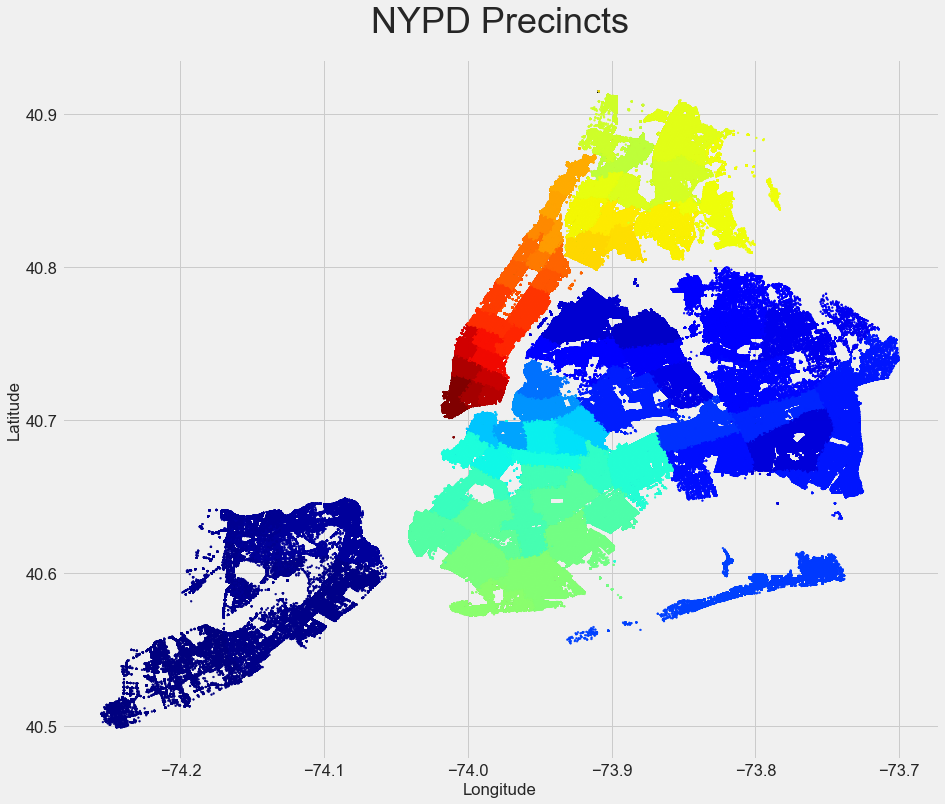

In [148]:
plt.figure(figsize=(14, 12))
plt.scatter(nypd.Longitude, nypd.Latitude, c=nypd['ARREST_PRECINCT'], s=3, cmap="jet_r"); #'tab20'
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('NYPD Precincts', fontsize=36, y=1.03);
print('Total NYPD Precincts:', nypd.ARREST_PRECINCT.nunique())

The NYPD has 77 precincts across 5 boroughs with a force of 35,000 uniformed officers

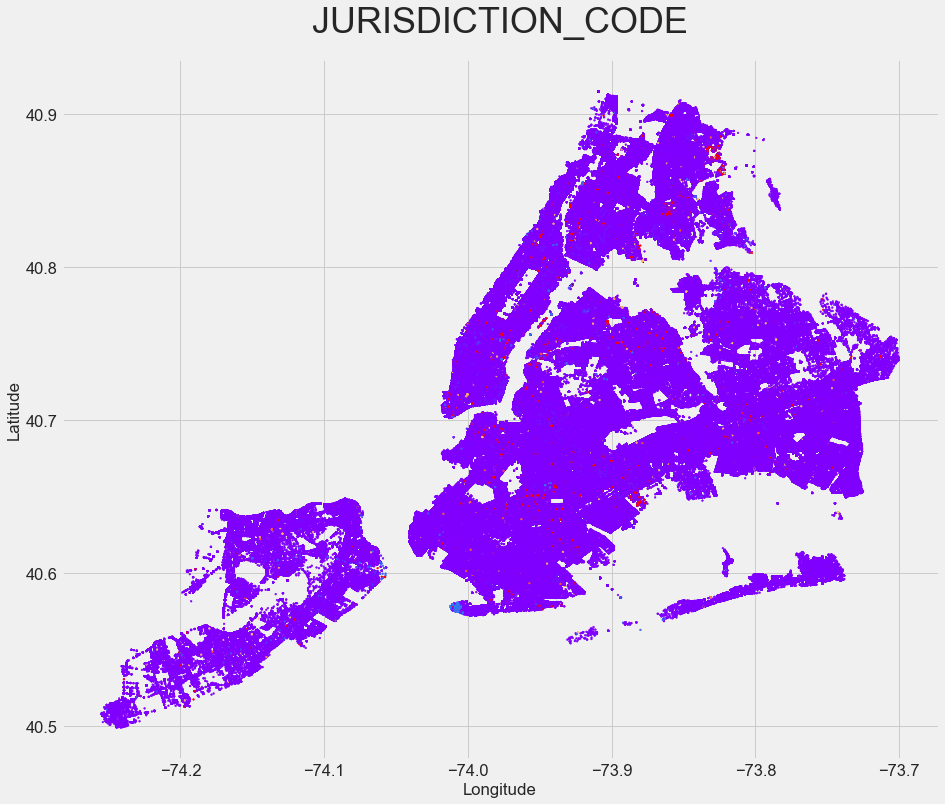

In [108]:
plt.figure(figsize=(14, 12))
plt.scatter(nypd.Longitude, nypd.Latitude, c=nypd['JURISDICTION_CODE'], s=3, cmap="rainbow"); #'tab20'
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('JURISDICTION_CODE', fontsize=36, y=1.03);
# nypd.JURISDICTION_CODE.value_counts()

The Jurisdiction Codes are overwhelmingly 0, and we decided to drop this column in the modeling notebook 

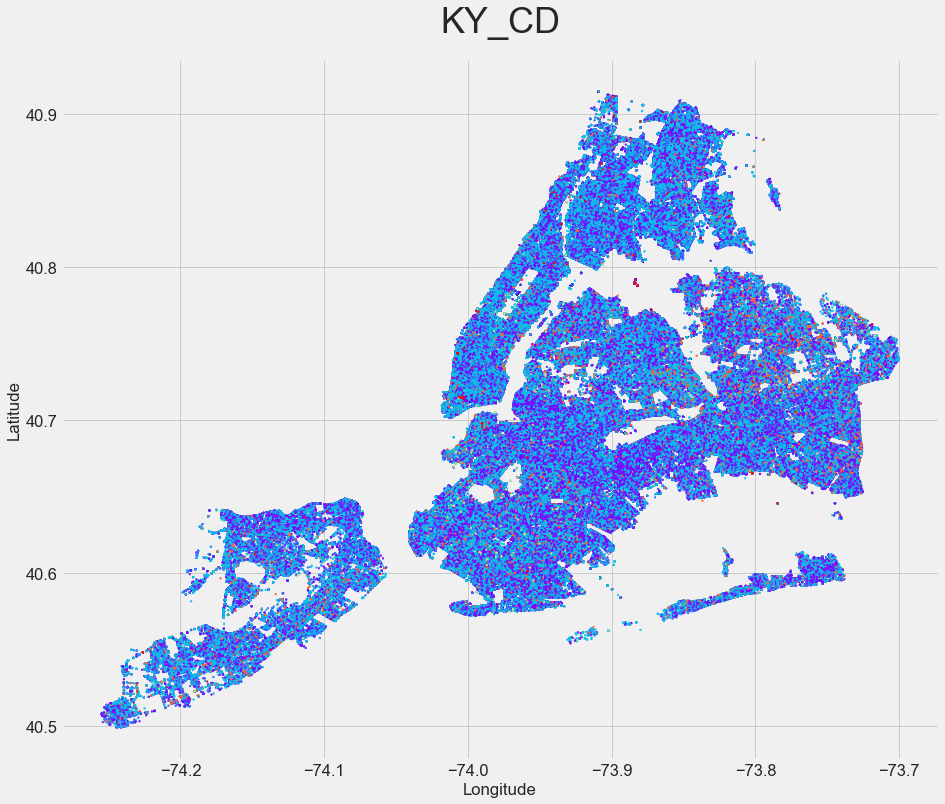

In [109]:
plt.figure(figsize=(14, 12))
plt.scatter(nypd.Longitude, nypd.Latitude, c=nypd['KY_CD'], s=3, cmap="rainbow"); #'tab20'
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('KY_CD', fontsize=36, y=1.03);
# nypd.KY_CD.value_counts()

The KY_CD number is a three digit offense classification code, but these do not appear to be entered a sufficient degree of precision to be useful for modeling 


---
## Demographics of Arrestees
---

In [107]:
nypd.PERP_RACE.value_counts()

BLACK                             2425200
WHITE HISPANIC                    1299277
WHITE                              603229
BLACK HISPANIC                     401735
ASIAN / PACIFIC ISLANDER           204620
UNKNOWN                             50174
AMERICAN INDIAN/ALASKAN NATIVE      11024
OTHER                                1363
Name: PERP_RACE, dtype: int64

In [108]:
nypd.PERP_RACE.value_counts(normalize=True)

BLACK                             0.485368
WHITE HISPANIC                    0.260031
WHITE                             0.120727
BLACK HISPANIC                    0.080401
ASIAN / PACIFIC ISLANDER          0.040952
UNKNOWN                           0.010042
AMERICAN INDIAN/ALASKAN NATIVE    0.002206
OTHER                             0.000273
Name: PERP_RACE, dtype: float64

Black arrestees are overrepresented among the arrest records for a city with a black population of approximately 28.9%. White New Yorkers make up almost 32.5% of the city's population but are less than half of that in the arrest record, and Asian-Pacific Islander make up 14% of the city's general population but make up only 4% of the arrest record 
Since the Census only has a single Hispanic category, the White Hispanic and Black Hispanic NYPD categories were consolidated in data cleaning for our modeling purposes, but left as they are in this notebook

---
## Nonviolent Crimes
---
A full list of the arrest descriptions used for nonviolent crime can be found in the data cleaning notebook. Here we plot and account for some unique trends in some of those arrest classifications and used those insights for encoding the alleged_offense column that was used for our models  

#### Marijuana
Seen below, marijuana arrests for both sale and possession are much more localized to certain precincts, and shows that marijuana arrests for Black people in particular outpace the already disproportionate number of Black people arrested by the NYPD. This data would also be useful for those pushing for the commuting of sentences for those who were charged following these arrests, as NYC has recently legalized marijuana. Sale and possession are counted as different offenses in our data cleaning process 

Description Count:
MARIJUANA, POSSESSION 4 & 5       422097
MARIJUANA, POSSESSION 1, 2 & 3     10705
MARIJUANA, POSSESSION              10055
Name: PD_DESC, dtype: int64

Arrestee Demographics:
BLACK                             0.526
WHITE HISPANIC                    0.248
WHITE                             0.097
BLACK HISPANIC                    0.094
ASIAN / PACIFIC ISLANDER          0.023
UNKNOWN                           0.009
AMERICAN INDIAN/ALASKAN NATIVE    0.002
OTHER                             0.000
Name: PERP_RACE, dtype: float64


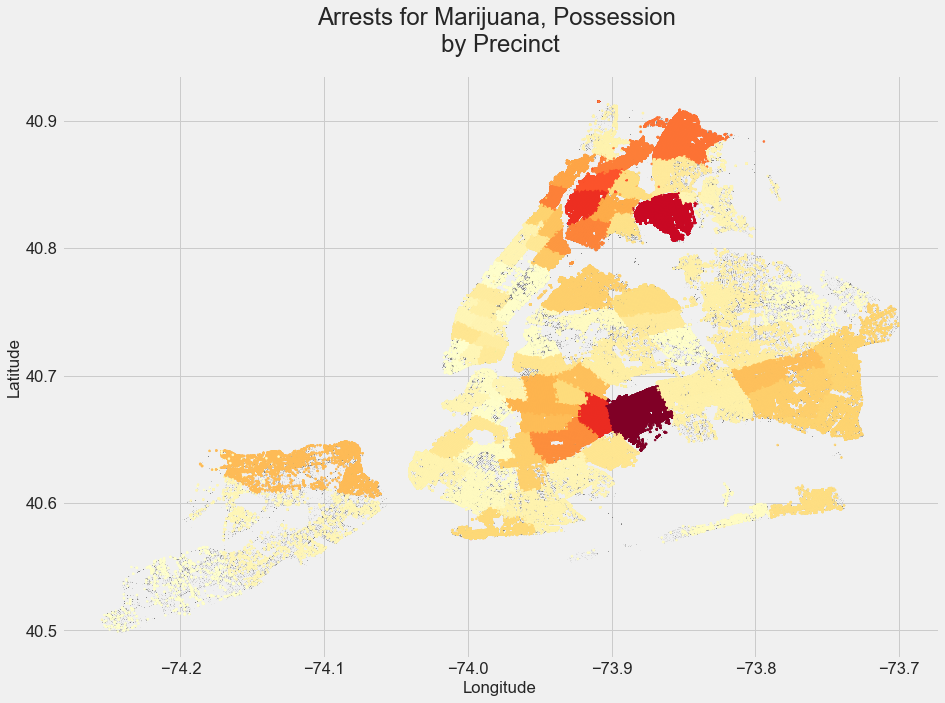

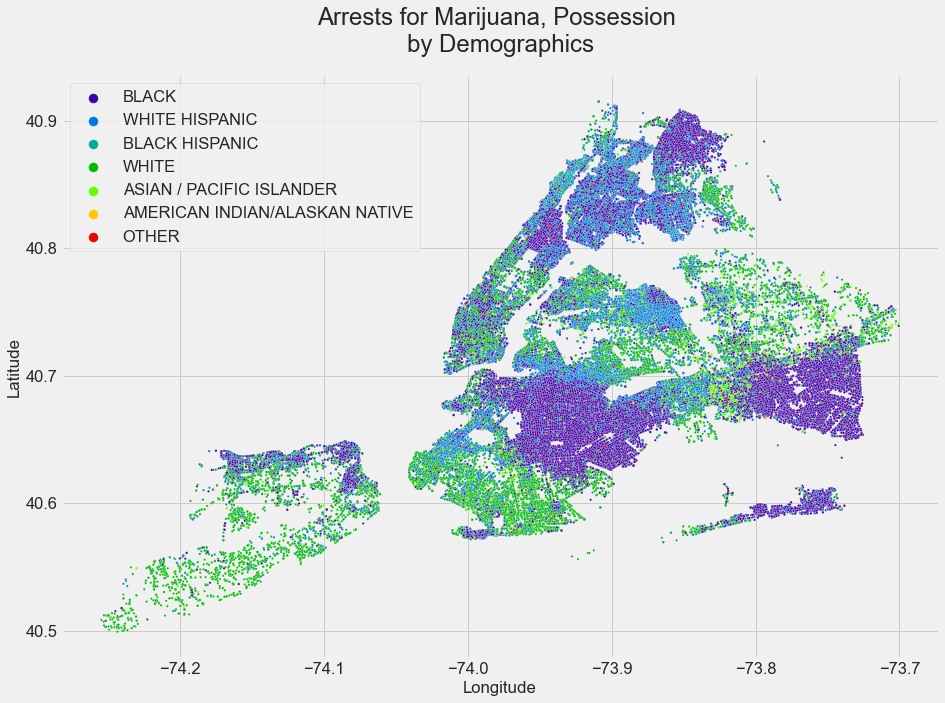

In [113]:
map_describe('MARIJUANA, POSSESSION')
arrest_demos_map('MARIJUANA, POSSESSION')

Description Count:
MARIJUANA, SALE 4 & 5       63560
MARIJUANA, SALE 1, 2 & 3     3197
Name: PD_DESC, dtype: int64

Arrestee Demographics:
BLACK                             0.565
WHITE HISPANIC                    0.227
BLACK HISPANIC                    0.125
WHITE                             0.056
ASIAN / PACIFIC ISLANDER          0.017
UNKNOWN                           0.007
AMERICAN INDIAN/ALASKAN NATIVE    0.001
OTHER                             0.000
Name: PERP_RACE, dtype: float64


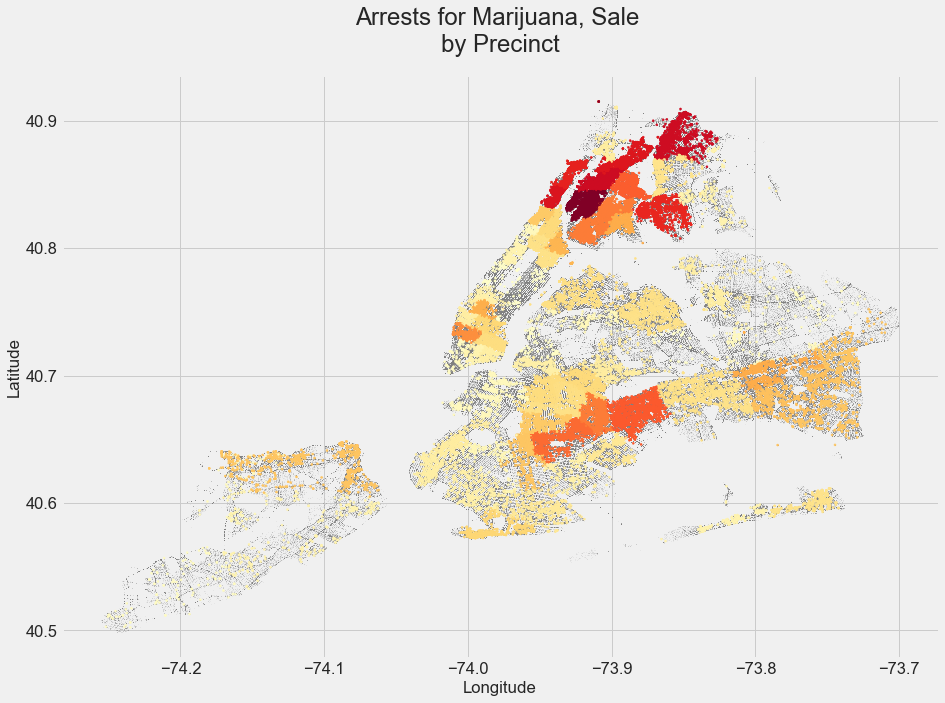

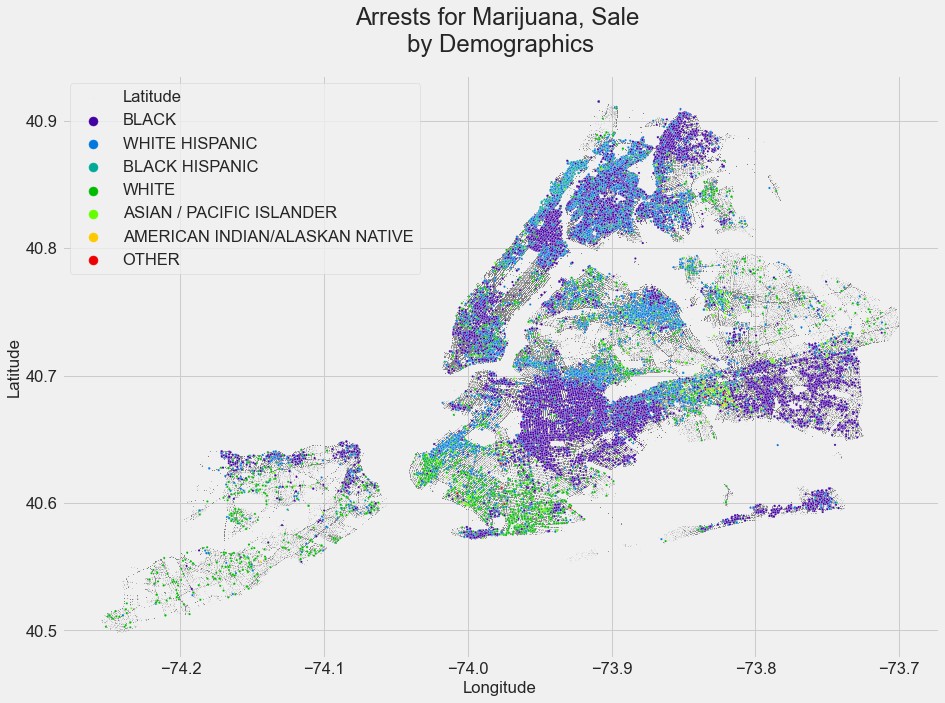

In [115]:
map_describe('MARIJUANA, SALE')
arrest_demos_map('MARIJUANA, SALE', True)

---

#### Controlled Substances
Also showing disproportionate locality between precincts including the more dubious ‘Intent to Sell’ category; that, possession, and sale are all encoded separately for our model  



Description Count:
CONTROLLED SUBSTANCE, POSSESSION 7             277688
CONTROLLED SUBSTANCE, POSSESSION 5              10979
CONTROLLED SUBSTANCE, POSSESSI                   9285
CONTROLLED SUBSTANCE,POSSESS. 1                  6734
CONTROLLED SUBSTANCE, POSSESSION 4               5924
CONTROLLED SUBSTANCE,POSSESS. 2                  5466
CONTROLLED SUBSTANCE,POSSESS. 3                  2382
CONTROLLED SUBSTANCE,POSSESS.                     929
CONTROLLED SUBSTANCE,POSSESS. OF PROCURSERS       126
Name: PD_DESC, dtype: int64

Arrestee Demographics:
BLACK                             0.445
WHITE HISPANIC                    0.265
WHITE                             0.179
BLACK HISPANIC                    0.082
ASIAN / PACIFIC ISLANDER          0.022
UNKNOWN                           0.006
AMERICAN INDIAN/ALASKAN NATIVE    0.001
OTHER                             0.000
Name: PERP_RACE, dtype: float64


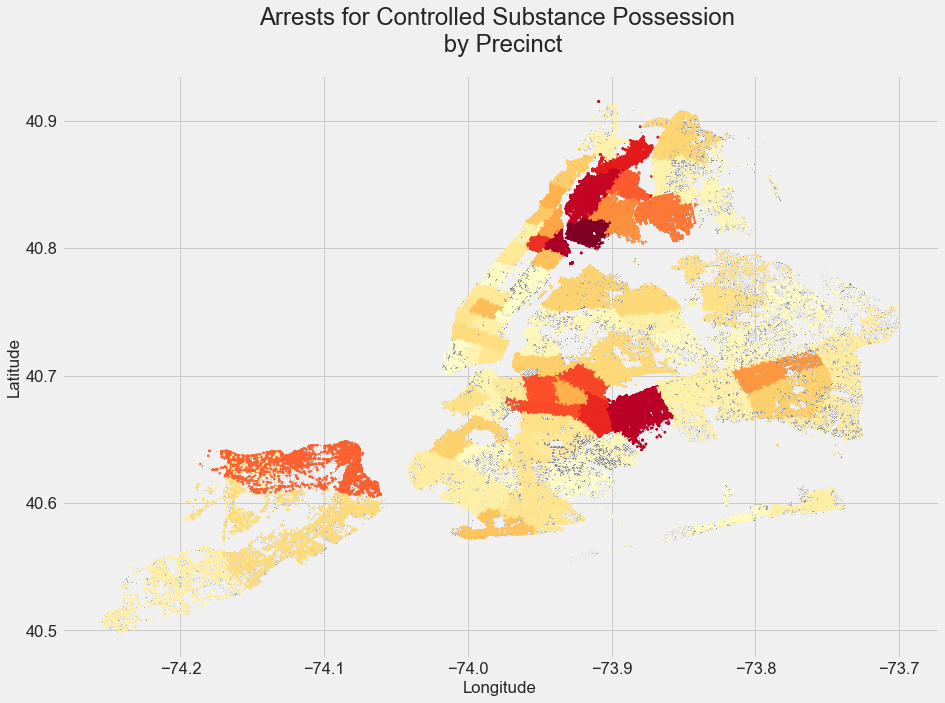

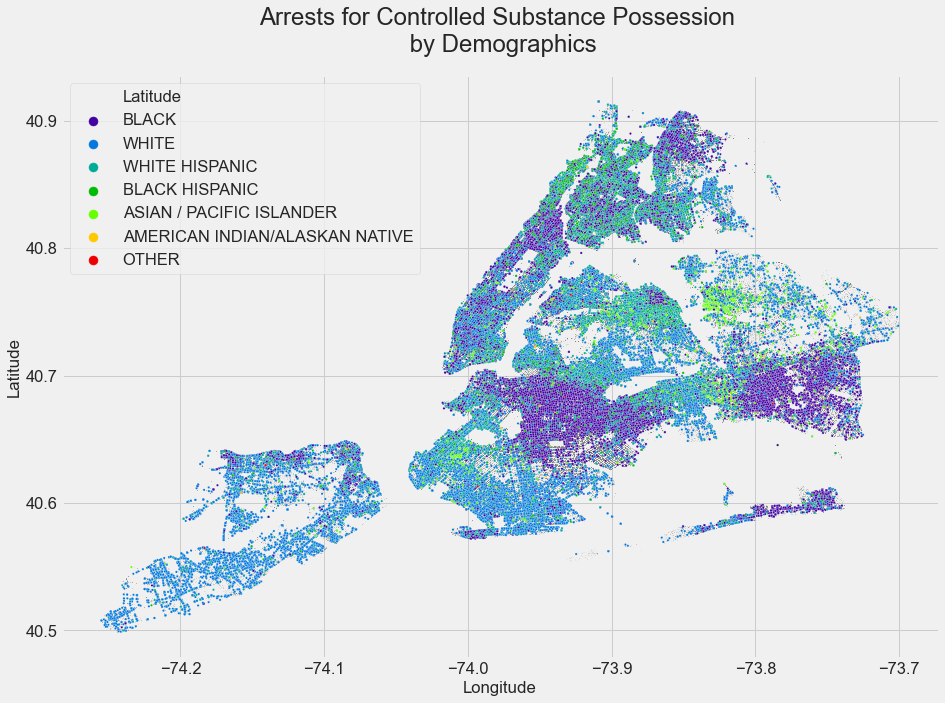

In [123]:
map_describe('CONTROLLED SUBSTANCE,\s*POSSE', title = 'CONTROLLED SUBSTANCE POSSESSION')
arrest_demos_map('CONTROLLED SUBSTANCE,\s*POSSE',True, title = 'CONTROLLED SUBSTANCE POSSESSION')

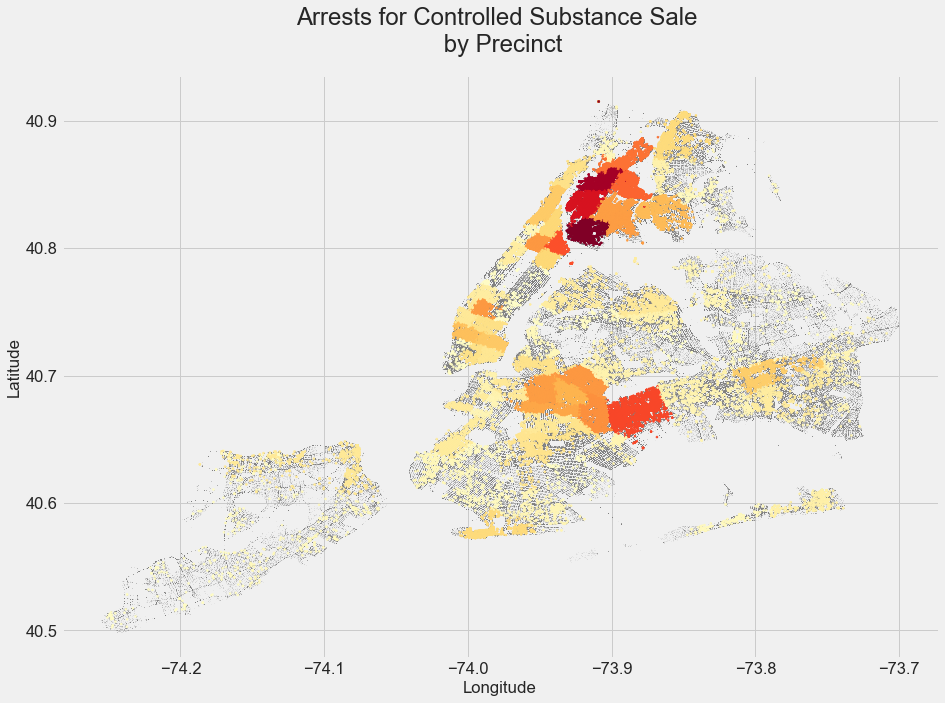

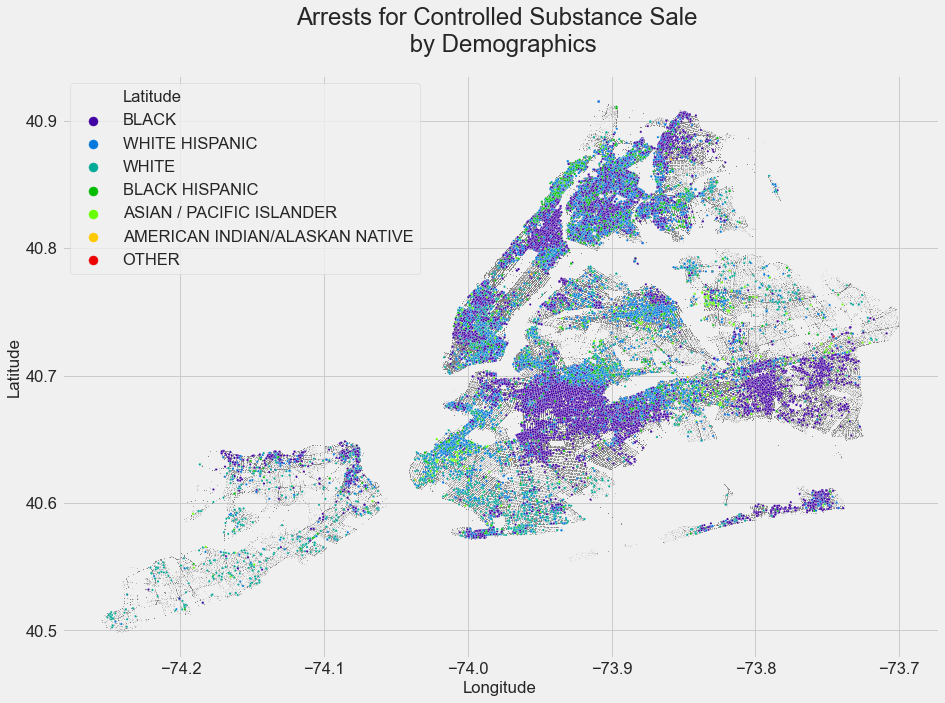

In [126]:
arrest_map('CONTROLLED SUBSTANCE,\s*SALE', title='CONTROLLED SUBSTANCE SALE')
arrest_demos_map('CONTROLLED SUBSTANCE,\s*SALE', True, title='CONTROLLED SUBSTANCE SALE')

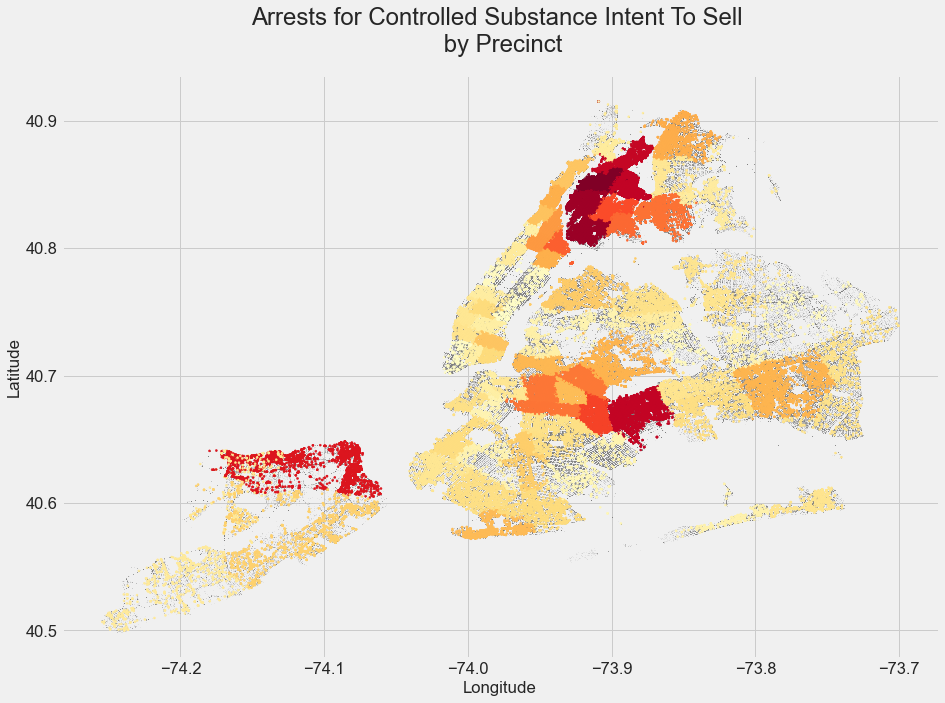

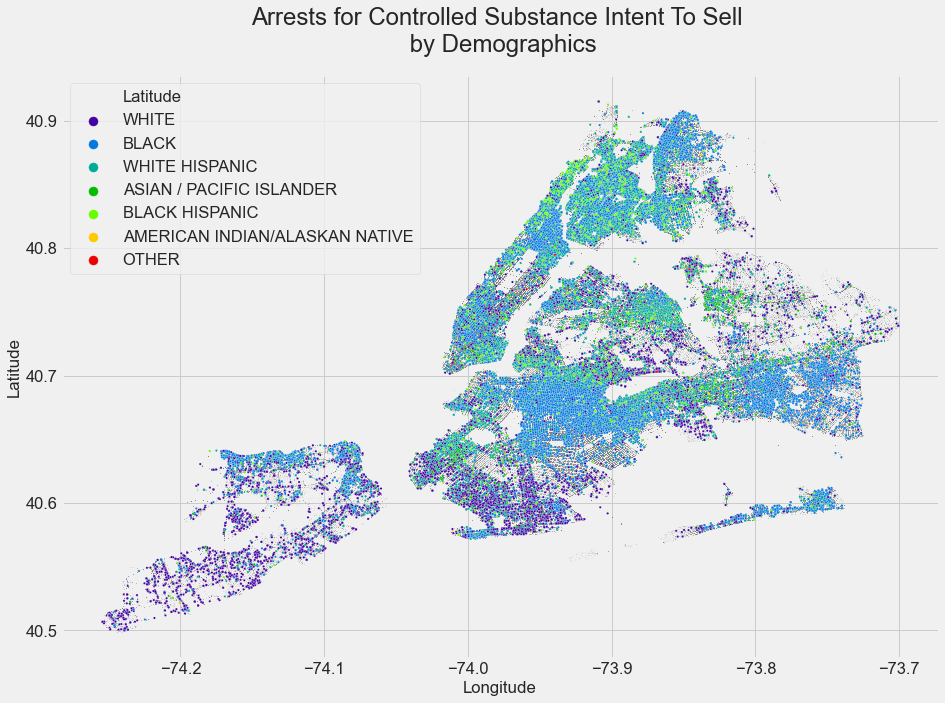

In [127]:
arrest_map('CONTROLLED SUBSTANCE,\s*INTENT', title='CONTROLLED SUBSTANCE INTENT TO SELL')
arrest_demos_map('CONTROLLED SUBSTANCE,\s*INTENT', True, title='CONTROLLED SUBSTANCE INTENT TO SELL')

---

#### Disorderly Conduct 
Another highly localized arrest classification with high racial disparity 

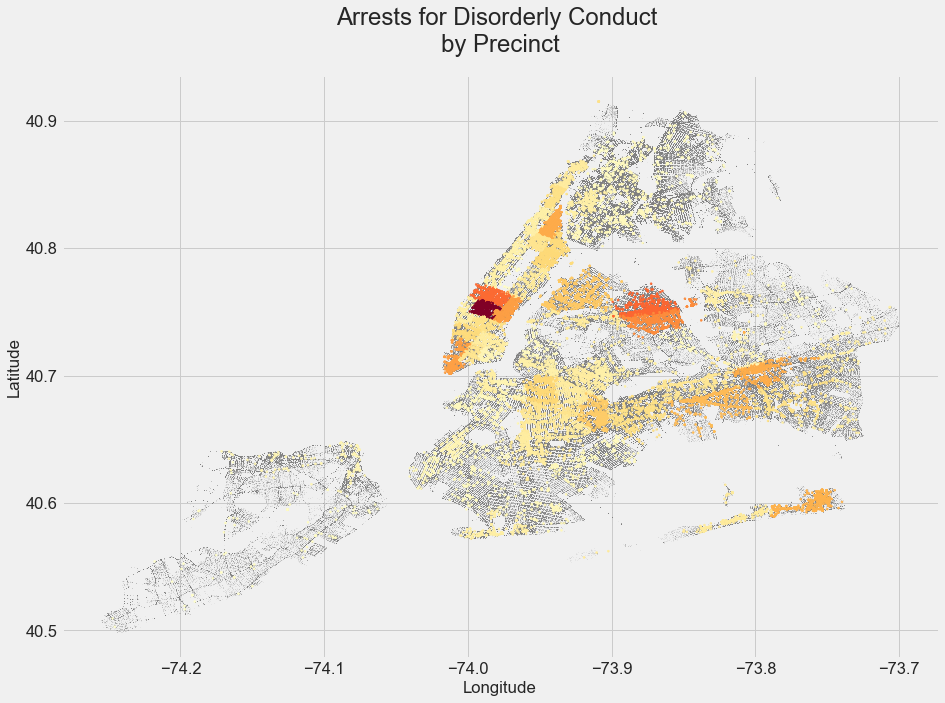

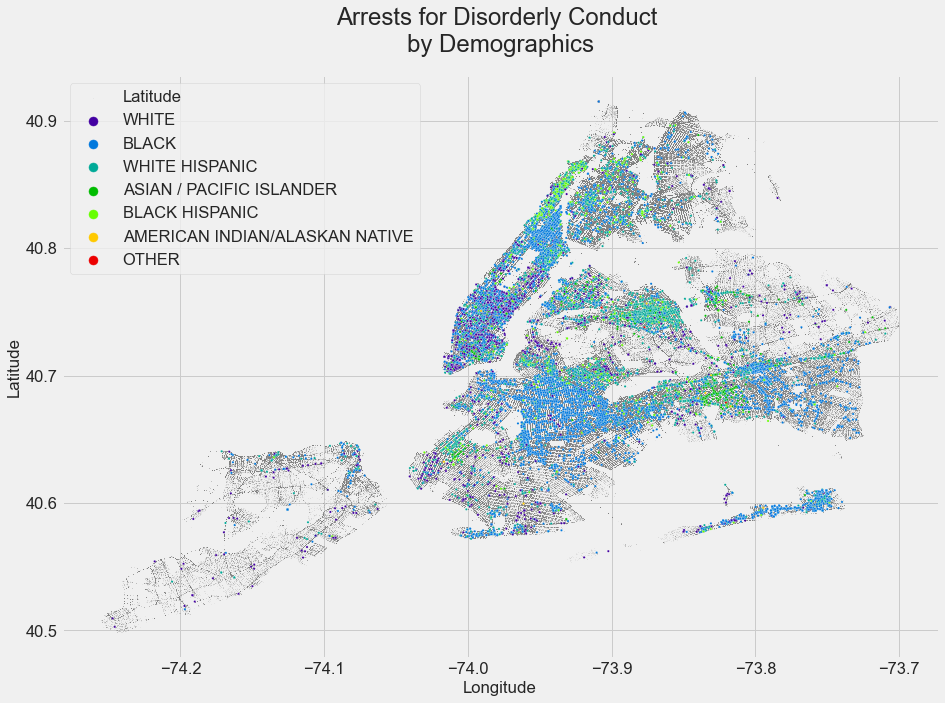

In [117]:
arrest_map('DISORDERLY CONDUCT')
arrest_demos_map('DISORDERLY CONDUCT', True)

---

#### Prostitution 
Prostitution arrests are highly localized to certain precincts. Here the entire set of prostitution arrests are represented, but for our selection of nonviolent crimes, particular care was taken to not include any underage or compulsory prostitution. While it is this group’s opinion that prostitution is a nonviolent activity, we wholeheartedly consider child prostitution to be a violent crime   

Description Count:
PROSTITUTION                                  20548
PROSTITUTION, PATRONIZING 4, 3                15037
LOITERING FOR PROSTITUTION OR TO PATRONIZE     7392
PROSTITUTION 4,PROMOTING&SECURING              1648
PROSTITUTION 3,PROMOTING BUSINESS              1059
PROSTITUTION 3, PROMOTING UNDER 19              311
PROSTITUTION,PERMITTING                         215
PROSTITUTION 2, COMPULSORY                       99
PROSTITUTION 2, UNDER 16                         85
PROSTITUTION 4,PROMOTING&SECUR                   64
PROSTITUTION 3,PROMOTING BUSIN                   38
PROSTITUTION 3, PROMOTING UNDE                   33
PROSTITUTION, PATRONIZING 2, 1                   30
PROSTITUTION 1, UNDER 11                          7
LOITERING FOR PROSTITUTION OR                     1
Name: PD_DESC, dtype: int64

Arrestee Demographics:
BLACK                             0.403
WHITE HISPANIC                    0.253
ASIAN / PACIFIC ISLANDER          0.146
WHITE                        

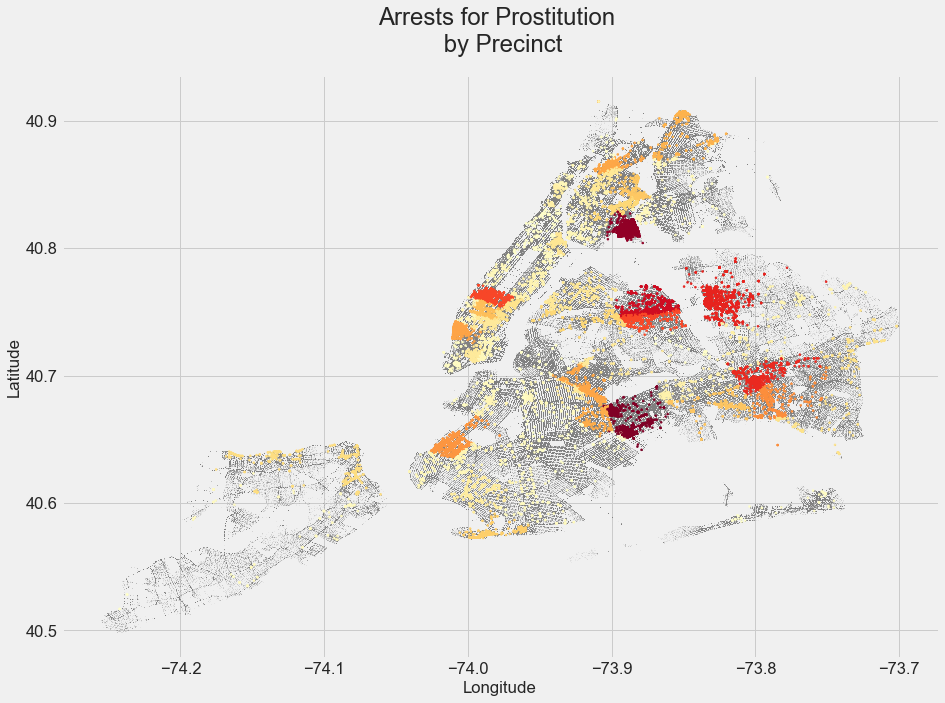

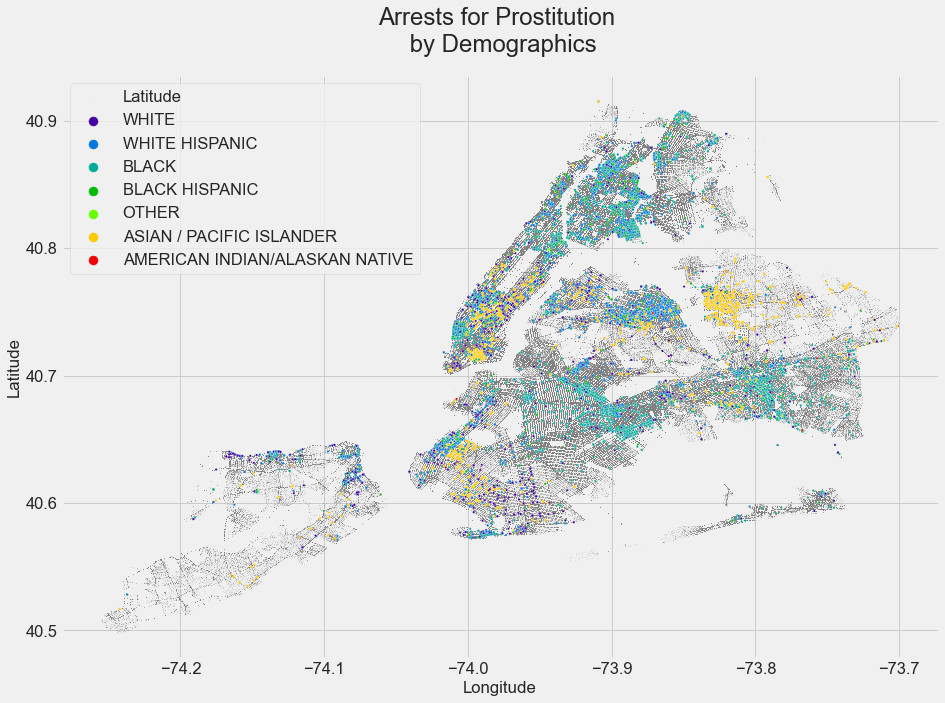

In [128]:
map_describe('PROSTITUTION')
arrest_demos_map('PROSTITUTION', True)

---

#### Mischief 
One of the most interesting findings, the NYPD has classifications for ‘Mischief, Criminal’ as well as ‘Criminal Mischief’, and there seems to be some racial disparity between the two, as Criminal Mischief sees white arrestees represented at almost double their rate over all arrestees, and Criminal Mischief seems uniquely overrepresented on the southern tip of Manhattan

Description Count:
MISCHIEF,CRIMINAL     UNCLASSIFIED 4TH DEG    70765
MISCHIEF,CRIMINAL,    UNCL 2ND                24681
MISCHIEF,CRIMINAL,    UNCL 2ND DEG 3RD DEG    23763
MISCHIEF,CRIMINAL     UNCLASSI                    1
Name: PD_DESC, dtype: int64

Arrestee Demographics:
BLACK                             0.409
WHITE HISPANIC                    0.275
WHITE                             0.186
BLACK HISPANIC                    0.075
ASIAN / PACIFIC ISLANDER          0.045
UNKNOWN                           0.008
AMERICAN INDIAN/ALASKAN NATIVE    0.003
OTHER                             0.000
Name: PERP_RACE, dtype: float64


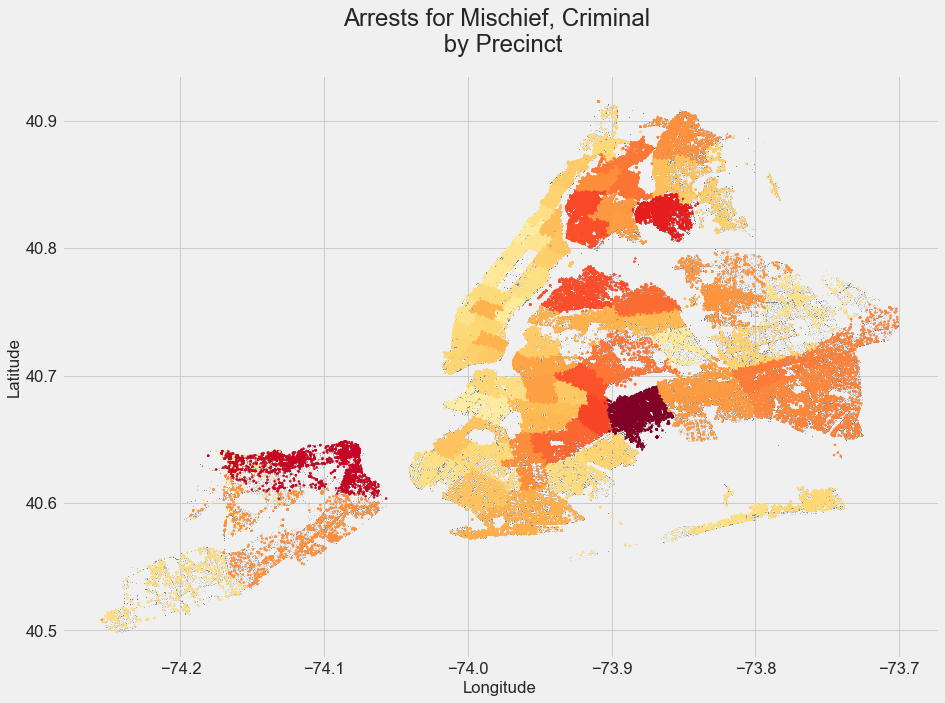

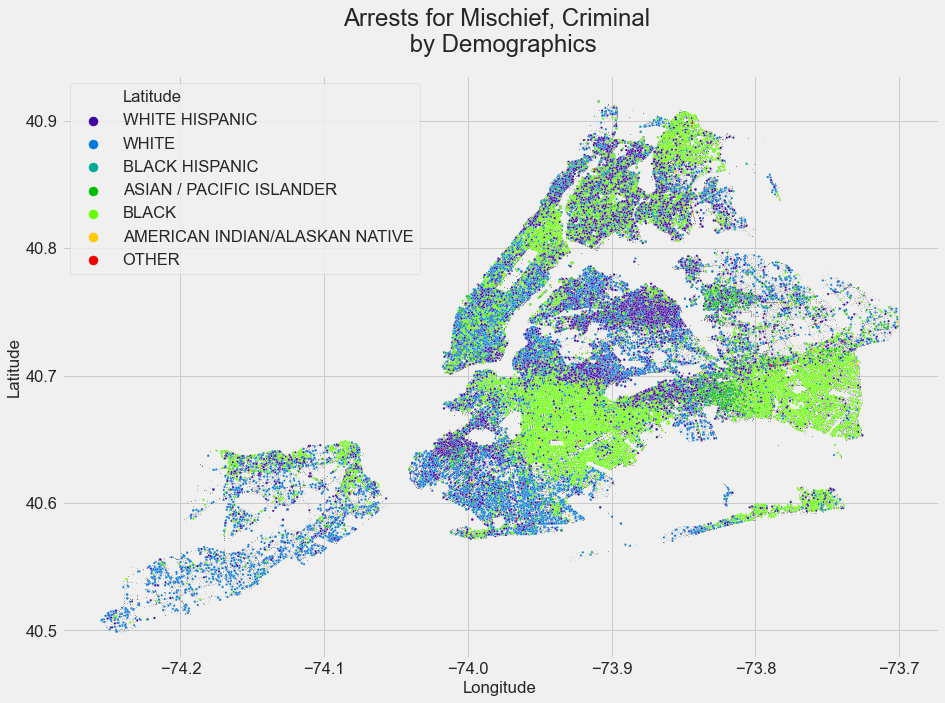

In [130]:
map_describe('MISCHIEF,CRIM', title='MISCHIEF, CRIMINAL')
arrest_demos_map('MISCHIEF,CRIM', True, title='MISCHIEF, CRIMINAL')

Description Count:
CRIMINAL MISCHIEF 4TH, GRAFFITI     17906
CRIMINAL MISCHIEF,UNCLASSIFIED 4     4237
CRIMINAL MISCHIEF 4TH, GRAFFIT        934
Name: PD_DESC, dtype: int64

Arrestee Demographics:
WHITE HISPANIC                    0.345
WHITE                             0.287
BLACK                             0.240
BLACK HISPANIC                    0.080
ASIAN / PACIFIC ISLANDER          0.038
UNKNOWN                           0.007
AMERICAN INDIAN/ALASKAN NATIVE    0.002
OTHER                             0.000
Name: PERP_RACE, dtype: float64


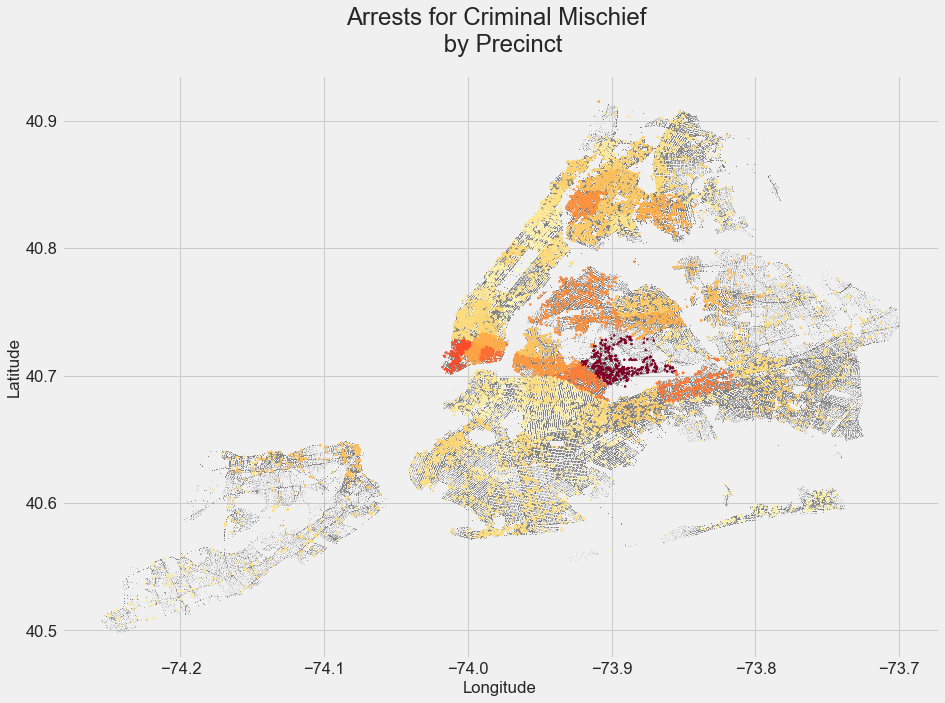

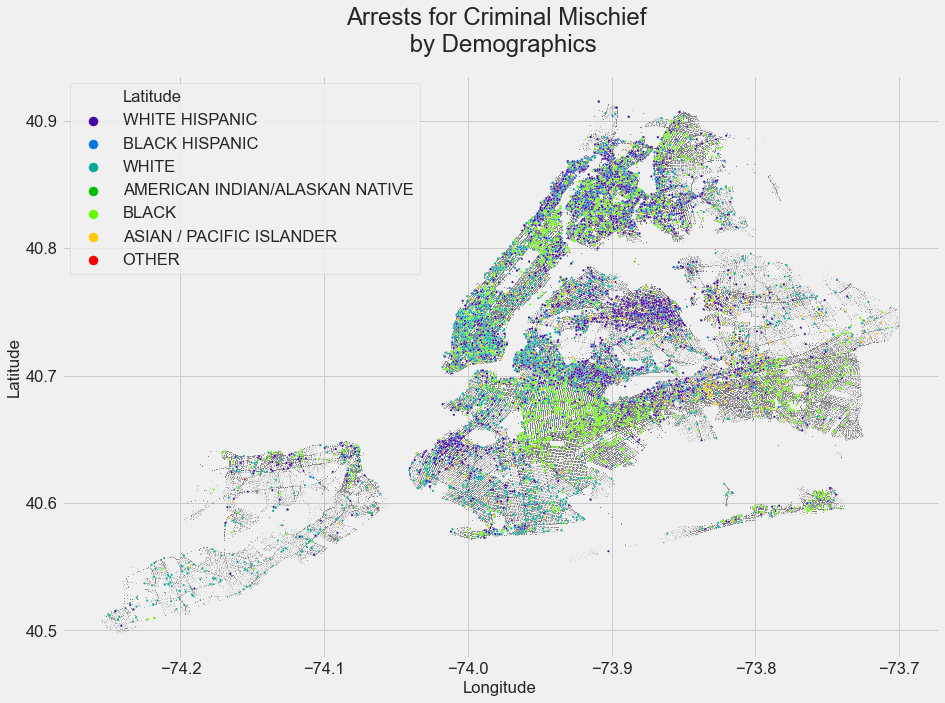

In [131]:
map_describe('CRIMINAL MISCHIEF')
arrest_demos_map('CRIMINAL MISCHIEF', True)

---

#### Burglar's Tools
While the NYPD has whole other classifications for Burglary, arrests for Burglar’s Tools are highly concentrated in lower Manhattan and seem like a very likely outcome of racial profiling 


Description Count:
BURGLARS TOOLS,UNCLASSIFIED    7379
Name: PD_DESC, dtype: int64

Arrestee Demographics:
BLACK                             0.438
WHITE HISPANIC                    0.312
WHITE                             0.131
BLACK HISPANIC                    0.084
ASIAN / PACIFIC ISLANDER          0.027
UNKNOWN                           0.006
AMERICAN INDIAN/ALASKAN NATIVE    0.002
OTHER                             0.000
Name: PERP_RACE, dtype: float64


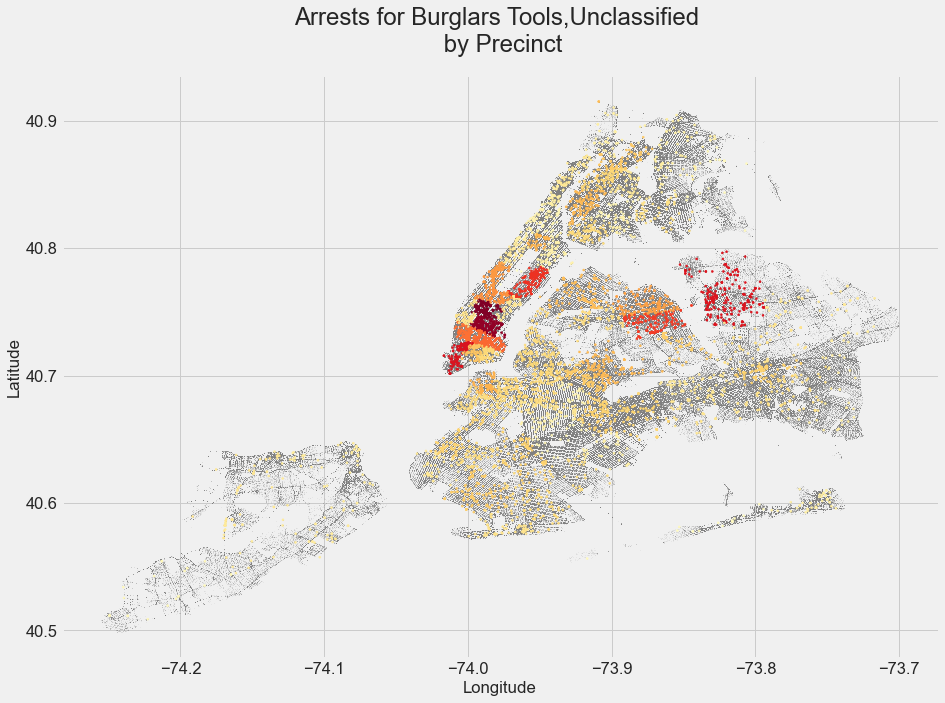

In [129]:
map_describe('BURGLARS TOOLS,UNCLASSIFIED')

---

#### Misdemeanor Forgery
Misdemeanor Forgery arrests are almost entirely concentrated in the Financial District, Chinatown, and Midtown Manhattan, which does make a certain kind of sense to anyone who has spent much time around there. Most definitely a nonviolent arrest and certainly one that is entirely up to the arresting officer for when to enforce it  

Description Count:
FORGERY,ETC.-MISD.    24772
Name: PD_DESC, dtype: int64

Arrestee Demographics:
BLACK                             0.422
ASIAN / PACIFIC ISLANDER          0.273
WHITE HISPANIC                    0.149
WHITE                             0.083
BLACK HISPANIC                    0.054
UNKNOWN                           0.014
AMERICAN INDIAN/ALASKAN NATIVE    0.004
OTHER                             0.000
Name: PERP_RACE, dtype: float64


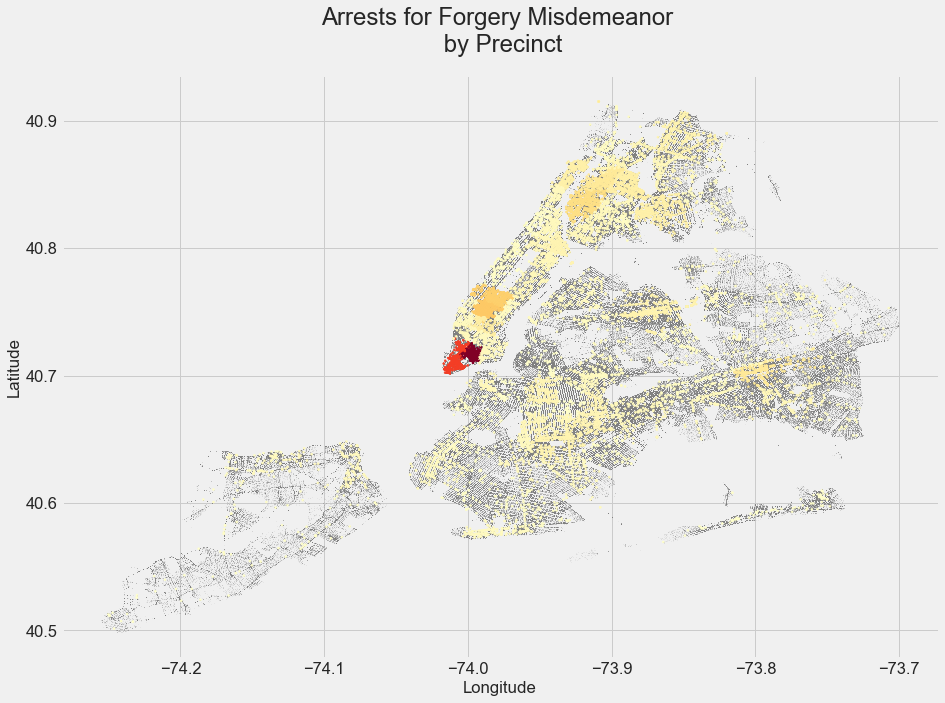

In [132]:
map_describe('FORGERY,ETC.-MISD', title='FORGERY MISDEMEANOR')

---

#### Other Categories
These were also used in our list of nonviolent arrests 

In [126]:
nypd[nypd.PD_DESC.str.contains('DISORDERLY CONDUCT')]['PD_DESC'].value_counts()

DISORDERLY CONDUCT SUBD 1,2,3,4,5,6,7    30104
DISORDERLY CONDUCT                         716
Name: PD_DESC, dtype: int64

In [127]:
nypd[nypd.PD_DESC.str.contains('ASSEMBLY,UNLAWFUL')]['PD_DESC'].value_counts()

ASSEMBLY,UNLAWFUL    5052
Name: PD_DESC, dtype: int64

In [128]:
nypd[nypd.PD_DESC.str.contains('GAMBLING')]['PD_DESC'].value_counts()

GAMBLING 2,PROMOTING,UNCLASSIFIED        6695
GAMBLING 1,PROMOTING,POLICY              2158
GAMBLING, DEVICE, POSSESSION             2017
GAMBLING 2, PROMOTING, POLICY-LOTTERY    1109
GAMBLING 1,PROMOTING,BOOKMAKING           724
LOITERING,GAMBLING,OTHER                  579
GAMBLING 2,PROMOTING,UNCLASSIF            362
GAMBLING 2, PROMOTING, BOOKMAKING         318
GAMBLING 1,PROMOTING,BOOKMAKIN             22
GAMBLING 2, PROMOTING, POLICY-              4
GAMBLING 2, PROMOTING, BOOKMAK              1
Name: PD_DESC, dtype: int64

---
---
---

In [131]:
nypd.PD_DESC.value_counts()[:50]
# nypd.PD_DESC.value_counts()[50:100]
# nypd.PD_DESC.value_counts()[100:150]
# nypd.PD_DESC.value_counts()[150:200]

MARIJUANA, POSSESSION 4 & 5                   422097
ASSAULT 3                                     400413
THEFT OF SERVICES, UNCLASSIFIED               302351
CONTROLLED SUBSTANCE, POSSESSION 7            277688
NY STATE LAWS,UNCLASSIFIED VIOLATION          225541
LARCENY,PETIT FROM OPEN AREAS,UNCLASSIFIED    188333
TRAFFIC,UNCLASSIFIED INFRACTION               164665
ASSAULT 2,1,UNCLASSIFIED                      162281
STOLEN PROPERTY 3,POSSESSION                  150886
ROBBERY,UNCLASSIFIED,OPEN AREAS               143157
TRAFFIC,UNCLASSIFIED MISDEMEAN                131079
CONTROLLED SUBSTANCE,INTENT TO SELL 3         113414
TRESPASS 3, CRIMINAL                          111952
INTOXICATED DRIVING,ALCOHOL                   106080
WEAPONS, POSSESSION, ETC                       98516
TRESPASS 2, CRIMINAL                           87315
CONTROLLED SUBSTANCE,SALE 3                    85764
LARCENY,GRAND FROM OPEN AREAS,UNCLASSIFIED     85191
PUBLIC ADMINISTRATION,UNCLASSIFIED FELONY     